***소설 네트워크 서비스 Truthsocial의 게시물 반응에 기반한 해시태그 네트워크 맵***

**기본 정보**

Truthsocial: X(구 트위터)와 유사한 형태의 SNS. 2021년 도널드 트럼프가 트위터에서 계정이 정지된 것에 대응하여 설립되었다. 표현의 자유를 표방하며, 트럼프 지지/공화당 지지 성향이 높은 유저가 많은 것이 특징. ->우파 성향의 유저들이 많을 것으로 가정하고 분석을 진행함.
(*정보 참고 링크: https://www.pewresearch.org/short-reads/2022/11/18/key-facts-about-truth-social-as-donald-trump-runs-for-u-s-president-again/*)

MAGA(Make America Great Again): 도널드 트럼프가 대선 기간 사용한 정치 슬로건.

사용 데이터: https://www.kaggle.com/datasets/kashishashah/truthsocial-2024-election-integrity-initiative

사용된 데이터의 기간: 2024년 1월~10월(*2024년 미국 대선: 2024.11.05.)*만 필터링 후 사용함.

사용 언어: 영어(English)

전처리: 주요 분석 칼럼인 해시태그 위주로 진행. 월별로 반응이 가장 많았던 상위 20개 해시태그 위주로 추림. 이후 네트워크 시각화 프로그램인 Gephi 분석을 위해 파일을 size(반응 정도)/degree(전파도)로 나누어 저장

목적: 프로젝트의 키워드인 가짜 뉴스와 해시태그 간의 관련성을 파악하기 위해 분석 실행.

In [ ]:
#패키지 사용
import pandas as pd
import nltk #자연어 처리
from nltk.corpus import stopwords #말뭉치-불용어 제거
from nltk.tokenize import word_tokenize #토큰화
from nltk.stem import WordNetLemmatizer #형태소-어간 추출
from nltk.sentiment import SentimentIntensityAnalyzer #감정 분석
from tqdm import tqdm #진척도 표시
from itertools import chain #리스트 연결
from itertools import combinations #가능한 조합(중복 X) 계산
from collections import Counter #합산할 때 사용
import ast #str 형태의 데이터를 전환


In [ ]:
#데이터 불러오기 및 필요 없는 열 및 행 삭제 
df=pd.read_csv('TruthSocial_2024_ElectionDataset.csv')

df['timestamp']=pd.to_datetime(df['timestamp'])
df.drop(columns=['url', 'status_links', 'media_urls', 'is_quote', 'is_retruth', 'is_reply', 
                 'replying_to', 'Scraping Date', 'external_id', 'tagged_accounts'], inplace=True)
df=df[(df['timestamp'].dt.year==2024) & (df['timestamp'].dt.month<=10)]
df['associated_tags']=df['associated_tags'].apply(lambda x: eval(x) if isinstance(x, str) else [])

In [ ]:
#불용어 제거(영어 기준 제거)
stop_words=set(stopwords.words('english'))
lemmatizer=WordNetLemmatizer()
sid=SentimentIntensityAnalyzer()

def preprocess_hashtags(hashtags): 
    filtered_hashtag = []
    for tags in hashtags:
        words=word_tokenize(tags.lower())
        words=[word for word in words if word not in stop_words]
        words=[lemmatizer.lemmatize(word) for word in words if word.isalnum()]
        filtered_hashtag.append(words)
    return filtered_hashtag

df['cleaned_tags']=df['associated_tags'].apply(preprocess_hashtags)

In [ ]:
#문자열을 리스트로 변환
#기호 제거, 대문자를 소문자로 통일, 정리
def clean_hashtags(tag):
    if isinstance(tag, str):
        return tag.strip('[]'').replace(''', '').split(', ') if ', ' in tag else [tag.lower()]
    return [tag] if isinstance(tag, list) else []

In [ ]:
#앞에서 리스트화했던 데이터를 행으로 펼침(explode)
#결측치 제거
df['year']=df['timestamp'].dt.year
df['month']=df['timestamp'].dt.month

df_exploded=df.explode('cleaned_tags')

df_exploded['cleaned_tags']=df_exploded['cleaned_tags'].apply(
    lambda x: x[0] if isinstance(x, list) and len(x)>0 else x
)

df_exploded.dropna(subset=['cleaned_tags'], inplace=True)
df_exploded['cleaned_tags']=df_exploded['cleaned_tags'].astype(str).str.lower()

In [ ]:
#월별로 top 20 해시태그 추출
hashtags_by_month=df_exploded.groupby(['year', 'month'])['cleaned_tags'].apply(list).to_dict()

monthly_top_20_hashtags={}
for (year, month), tags in tqdm(hashtags_by_month.items(), desc='Processing Monthly Top Hashtags'):
    if tags:
        flat_tags=list(chain.from_iterable(clean_hashtags(tag) for tag in tags))
        top_20=[tag for tag, _ in Counter(flat_tags).most_common(20)]
        monthly_top_20_hashtags[(year, month)]=top_20

df_exploded['is_top_20']=df_exploded.apply(lambda row: row['cleaned_tags'] in monthly_top_20_hashtags.get((row['year'], row['month']), []), axis=1)
df_exploded_top_20=df_exploded[df_exploded['is_top_20']]

hashtag_reactions_by_month=df_exploded_top_20.groupby(['year', 'month', 'cleaned_tags'])[['like_count', 'reply_count', 'retruth_count']].sum()

df_exploded_top_20=df_exploded_top_20.merge(
    hashtag_reactions_by_month.reset_index(),
    on=['year', 'month', 'cleaned_tags'],
    how='left'
)

Processing Monthly Top Hashtags: 100%|██████████| 10/10 [00:04<00:00,  2.08it/s]


In [ ]:
#해시태그 빈도 카운트
#gephi용 파일 변환-저장
def flatten_tags(tag_list):
    flat_tags=[]
    for tag in tag_list:
        if isinstance(tag, list):  
            flat_tags.extend(str(t) for t in tag)
        else:
            flat_tags.append(str(tag))
    return flat_tags

hashtags_by_month=df_exploded_top_20.groupby(['year', 'month'])['cleaned_tags'].apply(list).to_dict()

all_hashtags=list(chain.from_iterable(flatten_tags(tags) for tags in hashtags_by_month.values()))

hashtag_counts=Counter(all_hashtags)

nodes_data=[]
for (year, month), tag_lists in hashtags_by_month.items():
    flat_tags=flatten_tags(tag_lists)  #리스트 평탄화
    unique_tags=set(flat_tags)  #중복 제거
    for tag in unique_tags:
        nodes_data.append({'Id': tag, 'Label': tag, 'Size': hashtag_counts.get(tag, 1), 'year': year, 'month': month})

nodes_df=pd.DataFrame(nodes_data)
edges_counter=Counter()

for (year, month), tag_lists in hashtags_by_month.items():
    flat_tags=flatten_tags(tag_lists)
    unique_tags=set(flat_tags)
    if len(unique_tags)>1:
        edges_counter.update(((year, month, tag1, tag2) for tag1, tag2 in combinations(unique_tags, 2)))

edges_df=pd.DataFrame([{
    'year': year, 'month': month, 'Source': tag1, 'Target': tag2, 'Weight': count
} for (year, month, tag1, tag2), count in edges_counter.items()])

nodes_df['Time Interval']=nodes_df['year'].astype(str)+'-'+nodes_df['month'].astype(str)
edges_df['Time Interval']=edges_df['year'].astype(str)+'-'+edges_df['month'].astype(str)

nodes_df.to_csv('C:/project/nodes.csv', index=False, encoding='utf-8-sig')  
edges_df.to_csv('C:/project/edges.csv', index=False, encoding='utf-8-sig')  

In [ ]:
#해시태그 감성 분석
nltk.download('vader_lexicon')
sia=SentimentIntensityAnalyzer()

df=pd.read_csv('TruthSocial_2024_ElectionDataset.csv')
df['associated_tags']=df['associated_tags'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

all_hashtags=[tag for tags in df['associated_tags'].dropna() for tag in tags]
unique_hashtags=list(set(all_hashtags))
hashtag_sentiments={tag: sia.polarity_scores(tag)['compound'] for tag in unique_hashtags}

def classify_sentiment(score):
    if score>0.05:
        return 'positive'
    elif score<-0.05:
        return 'negative'
    else:
        return 'neutral'

hashtag_df=pd.DataFrame(list(hashtag_sentiments.items()), columns=['hashtag', 'sentiment_score'])
hashtag_df['sentiment'] = hashtag_df['sentiment_score'].apply(classify_sentiment)
hashtag_df.to_csv('hashtag_sentiment_analysis.csv', index=False)

#감성 분석을 시도하였으나 해시태그 특성상 유의미한 결과값을 얻지 못함(중립으로 나옴)

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


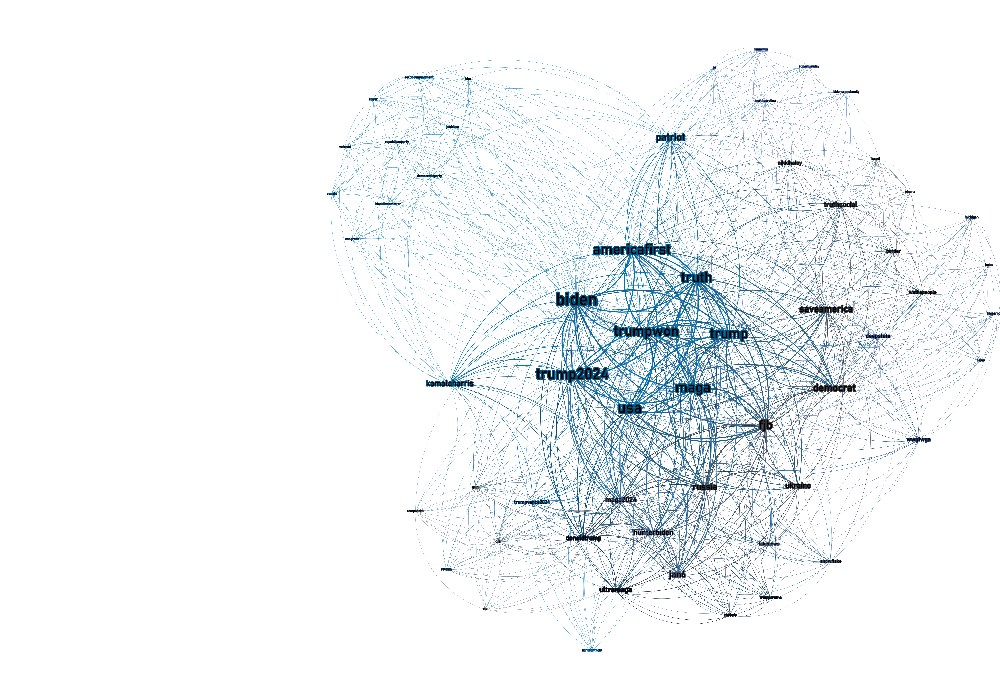

In [ ]:
#다양한 해시태그와 함꼐 쓰인 그래프. #확산도
from IPython.display import Image
Image("C:/Users/user/Desktop/network_degree.png")

***확산도(degree) 네트워크 맵***

맵의 중심부에 *maga*, *trimp2024*를 포함하여 *Biden*과 그를 비하하는 해시태그인 *fjb*, 2020년 미국 대선 선거 조작을 주장하는 해시태그인 *TrumpWon*, 그리고 민주당 대통령 후보였으며 AI 영상으로 인한 가짜 뉴스에 휘말렸던 *Kamalaharris*가 있는 것을 확인할 수 있었음.


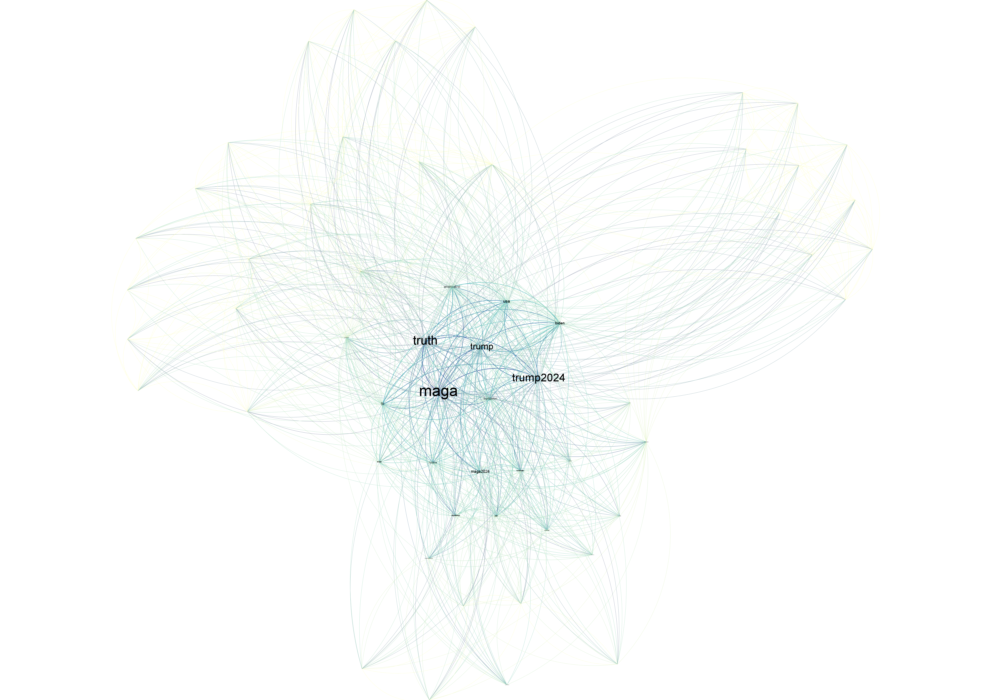

In [ ]:
#많이 쓰인 해시태그 분석 그래프. #인기도
from IPython.display import Image
Image("C:/Users/user/Desktop/network_size.png")

***Size(인기도) 네트워크 맵***

맵의 중심부에 *truth*, *trump*, 트럼프의 대선 구호인 *MAGA*, 그리고 2024년 트럼프 재출마 관련 해시태그인 *trump2024*가 존재함.

***Degree(확신도)/Size(인기도) 네트워크 맵을 보고 다음과 같이 추론함:***

Size 및 Degree의 값 둘 다 컸던 해시태그: MAGA, Trump2024->**트럼프의 선거 구호와 관련된 해시태그** 위주.

Size의 값이 낮고 Degree가 큰 해시태그: 개별 해시태그로는 주목도가 낮지만 대신 다양한 주제와 연결지을 수 있는 해시태그. 즉 **논쟁적 요소가 있는 해시태그**.
가령, 음모론과 관련이 있는 해시태그 **DeepState**, AI 영상으로 인한 뺑소니 관련 가짜 뉴스가 퍼졌던 후보 해시태그인 **Kamalaharris**, 그리고 바이든 전 대통령의 아들이자 여러 논란을 일으킨 **HunterBiden** 등이 포함됨.

Size의 값이 높고 Degree의 값이 낮은 경우: 일시적 해프닝, 화제의 지속성이 낮았던 해시태그라고 추측하나 이 경우에 속한 해시태그가 많지 않았음.



***결론***

가짜 뉴스와 관련된 해시태그는 Size의 값이 낮고 Degree의 값이 높을 가능성을 확인함. 즉, 가짜 뉴스와 관련된 해시태그는 각 사용자에게 좋아요, 재게시 등의 직접적인 반응을 불러 일으키는 것보다 다양한 해시태그와 연결되면서 많은 사람들에게 자연스럽게 확산되는 경향이 큼.

***아쉬웠던 점***

데이터 내에서 해시태그와 같이 사용된 정확한 게시물 내용은 확인할 수 없었기 때문에 해당 해시태그가 긍/부정 중 어느 쪽으로 사용되었는지는 알 수 없었음. 같은 이유로 감정 분석 또한 실행 중지함.

보다 깔끔한 네트워크 맵 구현 방식을 고려해보는 것도 좋을 것 같다.